In [1]:
import pandas as pd
import numpy as np

from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

import scvelo as scv
import scanpy as sc
import anndata as an
import scvi
from scipy.stats import zscore

import matplotlib.pyplot as plt
import seaborn as sns

# Load expression

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/cell_cycle_velocity.h5ad"
adata = sc.read_h5ad(fpath)
adata

CPU times: user 295 ms, sys: 1.29 s, total: 1.58 s
Wall time: 2.92 s


AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_

In [3]:
%%time
before = adata.shape[0]

sc.pp.filter_cells(adata, min_counts=8000)
sc.pp.filter_genes(adata, min_counts=50)

after = adata.shape[0]
filtered = before - after

print(f"Cells before filtering: {before}")
print(f"Cells after filtering:  {after}")
print(f"Cells filtered out:     {filtered}")

adata

Cells before filtering: 7541
Cells after filtering:  6895
Cells filtered out:     646
CPU times: user 1.65 s, sys: 3.31 s, total: 4.96 s
Wall time: 4.97 s


AnnData object with n_obs × n_vars = 6895 × 15906
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100 80GB PCIe MIG 3g.40gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-b0322fd2-c5fa-58ce-9ae8-321051669590]


Epoch 253/500:  51%|█████     | 253/500 [04:11<04:05,  1.01it/s, v_num=1, train_loss_step=9.64e+3, train_loss_epoch=9.69e+3]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 9775.577. Signaling Trainer to stop.


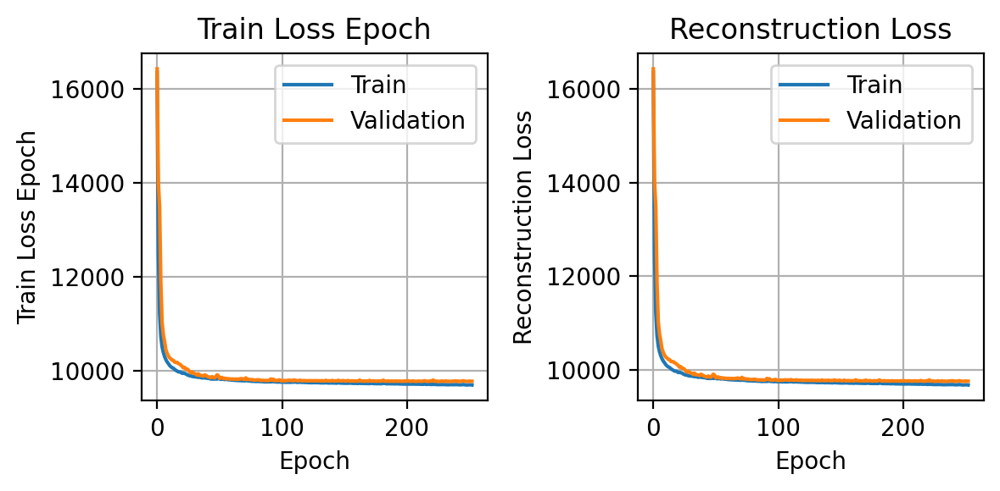

CPU times: user 1min 46s, sys: 2min 26s, total: 4min 12s
Wall time: 4min 13s


In [4]:
%%time
batch_key = "batch"

bdata = adata.copy()

# scvi
scvi.model.SCVI.setup_anndata(
    bdata, 
    batch_key=batch_key,
)

model = scvi.model.SCVI(
    bdata,
    n_hidden=128,
    n_latent=24,
    n_layers=2, 
    dispersion='gene-cell',
    gene_likelihood='zinb',
)

model.train(
    max_epochs=500,
    accelerator='gpu',
    early_stopping_patience=10,
    early_stopping=True,
    batch_size=500,
    plan_kwargs={"lr": 1e-3},
)

history = model.history

metrics = [
    ("train_loss_epoch", "validation_loss"),
    ("reconstruction_loss_train", "reconstruction_loss_validation"),
]

plt.rcParams['figure.dpi'] = 200
fig, axes = plt.subplots(1, 2, figsize=(6, 3))
axes = axes.flatten()

for i, (train_key, val_key) in enumerate(metrics):
    ax = axes[i]
    train_df = history[train_key]
    val_df = history[val_key]

    ax.plot(train_df.index, train_df[train_key], label='Train')
    ax.plot(val_df.index, val_df[val_key], label='Validation')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(train_key.replace('_train', '').replace('_', ' ').title())
    ax.set_title(train_key.replace('_train', '').replace('_', ' ').title())
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

# Generate Embeddings

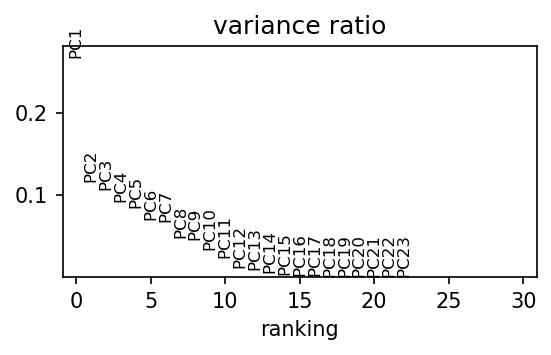

embed.obs["leiden"].nunique()=5
                   phase leiden cluster_phase
AAACCAAAGGGTAGCA-1   G2M      0           G2M
AAACCAAAGTAAGGGT-1    G1      1            G1
AAACCATTCAGGTAGG-1   G2M      0           G2M
AAACCATTCCAGCCCT-1    G1      1            G1
AAACCATTCGTGACCG-1    G1      1            G1


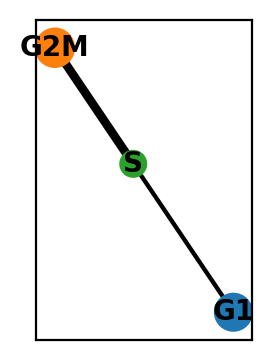

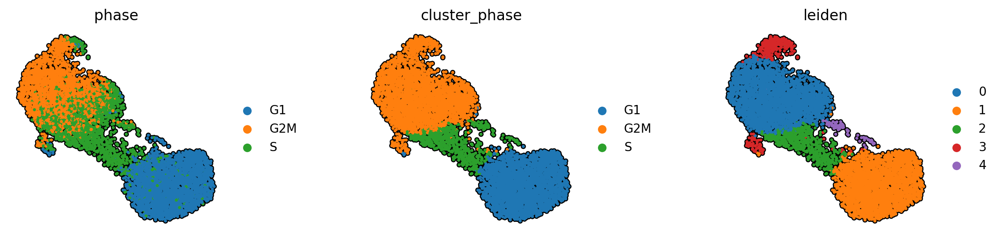

CPU times: user 26.7 s, sys: 273 ms, total: 27 s
Wall time: 25.3 s


In [28]:
%%time 

n_neighbors = 75
n_pcs = 10
resolution = 0.45
min_dist = 0.3
paga_groups = 'cluster_phase'


embed = model.get_latent_representation()
embed = sc.AnnData(embed, obs=adata.obs)

sc.pp.pca(embed)

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 2
sc.pl.pca_variance_ratio(embed)

sc.pp.neighbors(embed, n_pcs=n_pcs, n_neighbors=n_neighbors)
sc.tl.leiden(embed, resolution=resolution)
print(f"{embed.obs["leiden"].nunique()=}")

# find most frequent phase per leiden cluster
mode_map = (
    embed.obs.groupby("leiden")["phase"]
    .agg(lambda x: x.value_counts().idxmax())
    .to_dict()
)

# assign to new column
embed.obs["cluster_phase"] = embed.obs["leiden"].map(mode_map)
print(embed.obs[['phase', 'leiden', 'cluster_phase']].head().to_string())

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 2
sc.tl.paga(embed, groups=paga_groups)
sc.pl.paga(embed)
sc.tl.umap(embed, min_dist=min_dist, init_pos='paga')

palette = {
    "G1": "#D73027",        
    "S": "#FDAE61",       
    "G2M": "#1A9850",    
    "unknown": "#B0B0B0", 
}

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    embed,
    color=['phase', 'cluster_phase', 'leiden'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

# Get Imputed Expression

In [29]:
%%time
X = model.get_normalized_expression(library_size=1e6)

# make sure the index matches adata.obs index
X = X.loc[adata.obs.index]
X = X[adata.var.index]

# add to adata
adata.obs['cluster_phase'] = embed.obs['cluster_phase'].copy()
adata.layers['scvi'] = X.copy()
adata.obsm['X_umap'] = embed.obsm['X_umap'].copy()
adata.obsm['X_scvi'] = embed.X.copy()

adata

CPU times: user 1.7 s, sys: 1.61 s, total: 3.31 s
Wall time: 2.63 s


AnnData object with n_obs × n_vars = 6895 × 15906
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'cluster_phase', 'early_g1_score', 'G1_stage', 'g1_score', 'phase_length', 'phase_offset', 'dpt_rank', 'time_hours', 

# MAGIC

In [7]:
%%time
magic = sc.external.pp.magic(
    adata,
    knn=20,
    solver='approximate',
    verbose=True,
    copy=True,
)

adata.layers['X_magic'] = magic.X.copy()
adata

Calculating MAGIC...
  Running MAGIC on 6895 cells and 15906 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 20.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 4.85 seconds.
    Calculating affinities...
    Calculated affinities in 4.86 seconds.
  Calculated graph and diffusion operator in 30.27 seconds.
  Calculating imputation...
  Calculated imputation in 0.11 seconds.
Calculated MAGIC in 31.01 seconds.
CPU times: user 42.7 s, sys: 2.62 s, total: 45.3 s
Wall time: 34.8 s


AnnData object with n_obs × n_vars = 6895 × 15906
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'cluster_phase'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

len(genes)=9


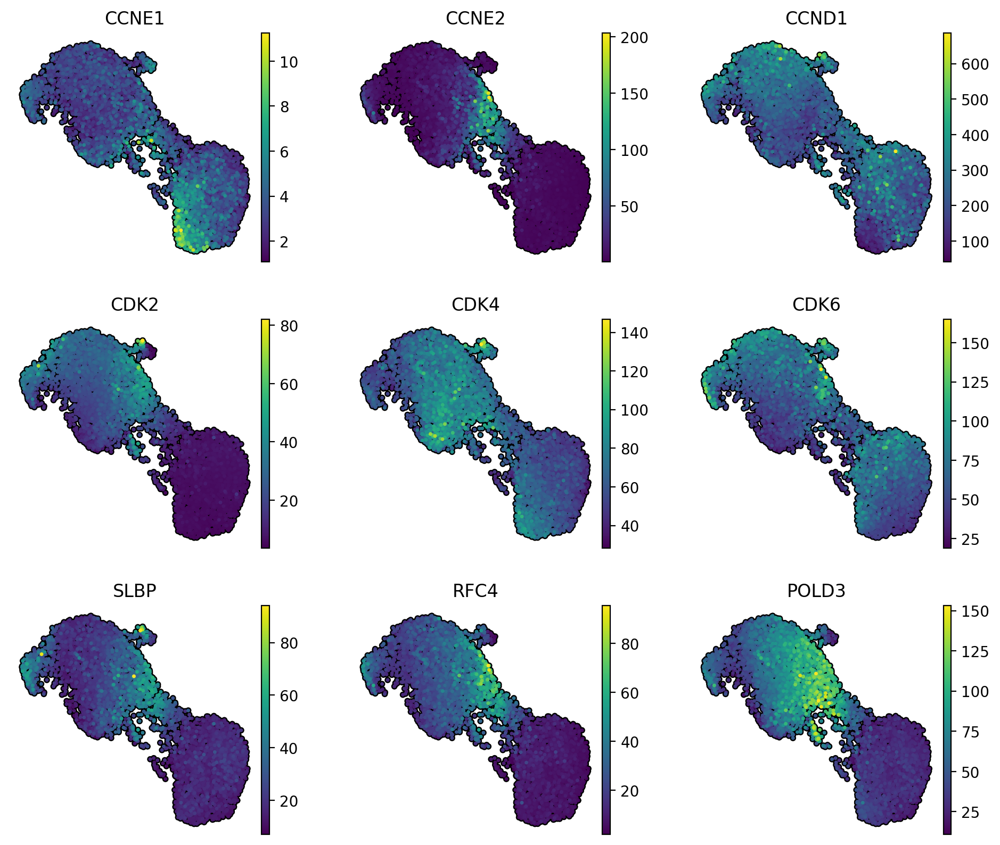

In [8]:
# G1 genes
genes = [
    "CCNE1", "CCNE2", "CCND1", "CDK2", "CDK4", "CDK6",
    "SLBP", "RFC4", "POLD3"
]
genes = [x for x in genes if x in adata.var_names]
print(f"{len(genes)=}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes,
    palette=palette,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='scvi',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

len(genes)=16


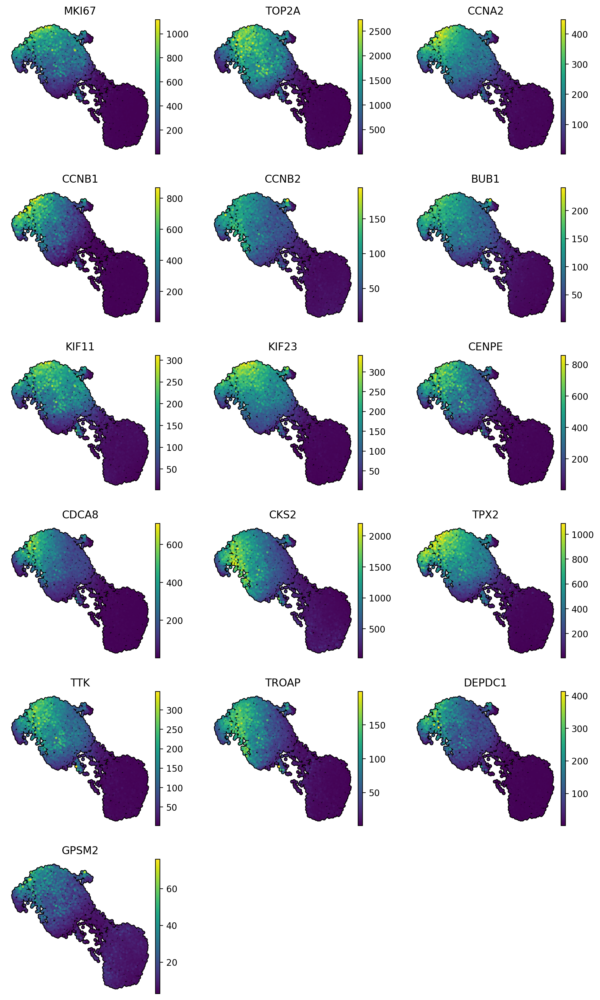

In [9]:
# G2/M Genes
genes = [
    "MKI67", "TOP2A", "CCNA2", "CCNB1", "CCNB2",
    "BUB1", "KIF11", "KIF23", "CENPE",
    "CDCA8", "CKS2", "TPX2", "TTK", "TROAP", "DEPDC1", "GPSM2"
]

genes = [x for x in genes if x in adata.var_names]
print(f"{len(genes)=}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes,
    palette=palette,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='scvi',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

From:

A. Riba et al., “Cell cycle gene regulation dynamics revealed by RNA velocity and deep-learning,” Nat Commun, vol. 13, no. 1, p. 2865, May 2022, doi: 10.1038/s41467-022-30545-8.


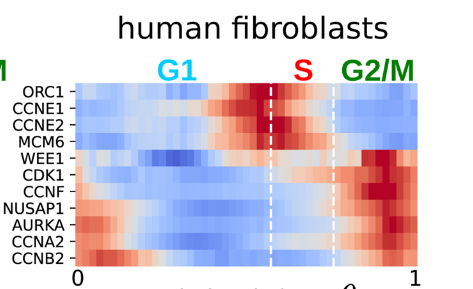

len(genes)=11


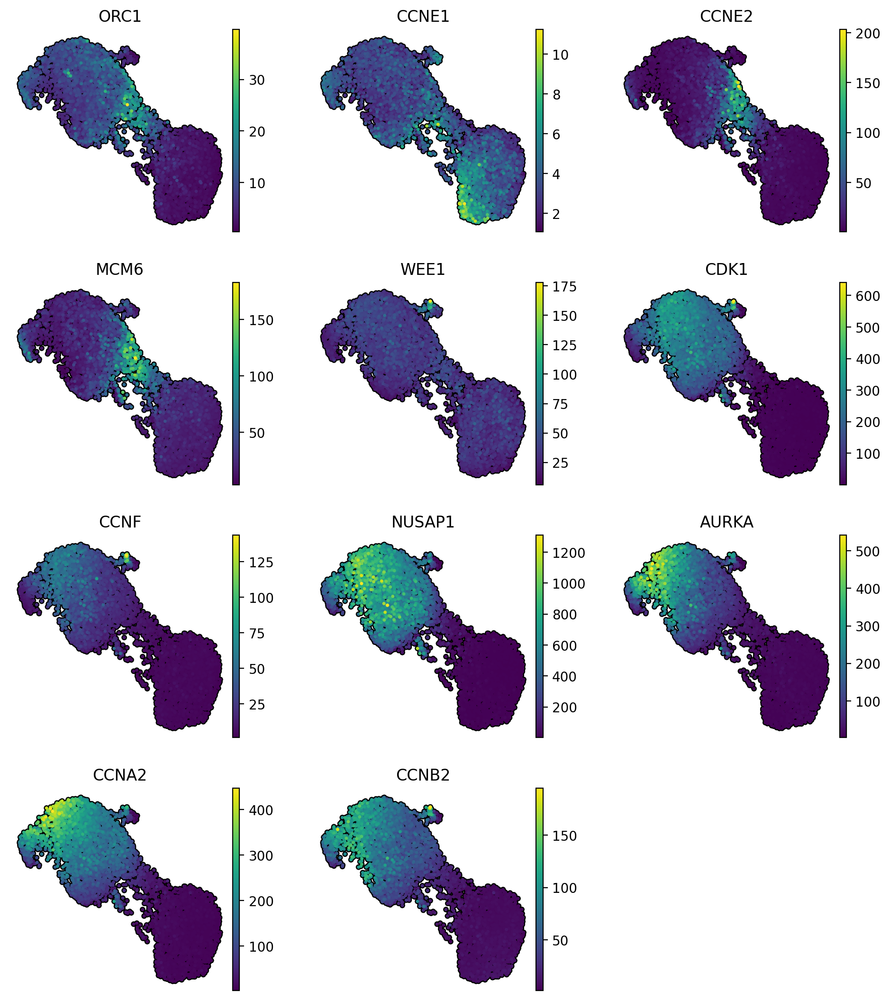

In [10]:
genes = [
    "ORC1","CCNE1","CCNE2",
    "MCM6","WEE1","CDK1",
    "CCNF","NUSAP1","AURKA",
    "CCNA2","CCNB2"
]

genes = [x for x in genes if x in adata.var_names]
print(f"{len(genes)=}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes,
    palette=palette,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='scvi',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)


# Early G1

Identify early G1 genes from:

M. J. Beyrouthy et al., “Identification of G1-Regulated Genes in Normally Cycling Human Cells,” PLOS ONE, vol. 3, no. 12, p. e3943, Dec. 2008, doi: 10.1371/journal.pone.0003943.


      gene  mean_expr
6    STAT1  12.809405
7      FOS   2.275027
0  SLC38A1   1.592091
5      BBX   1.437478
1  ANKRD12   1.185607
8     XRN1   1.180620
4    MFAP4   0.686142
2     EGR1   0.625579
3   ZNF217   0.587460


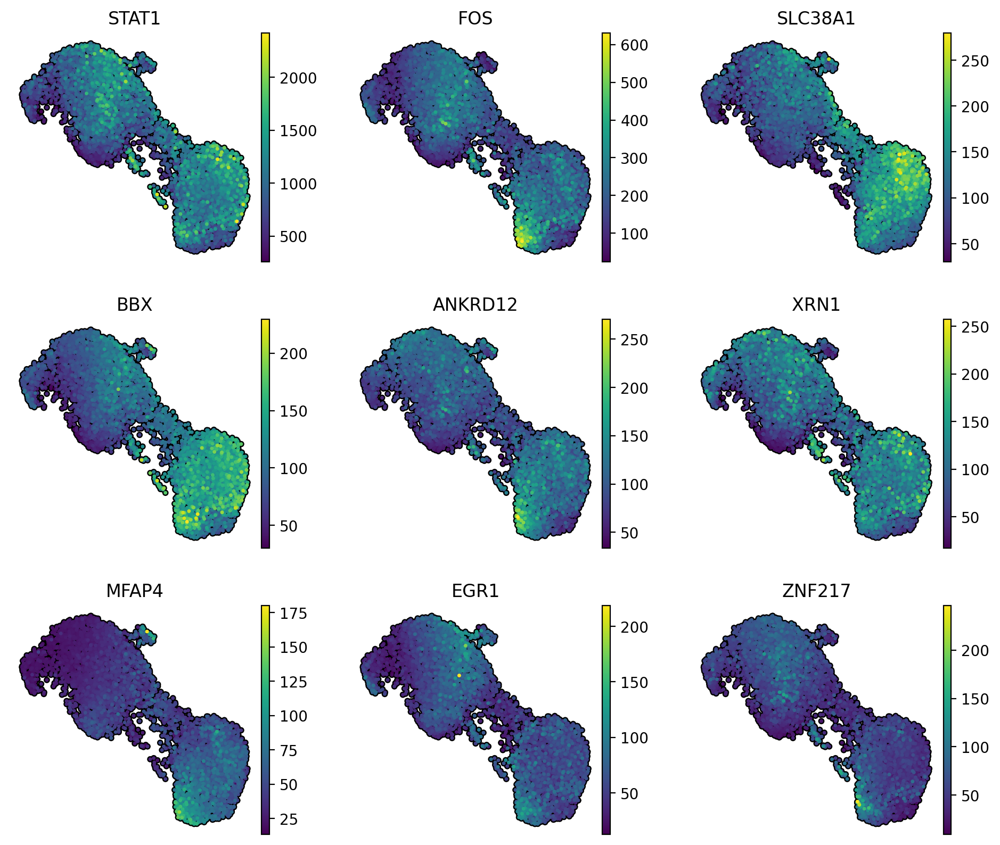

In [11]:
genes = [
    "FOS", "STAT1", "MFAP4", "EGR1", "ZNF217",
     "SLC38A1","BBX","XRN1", "ANKRD12",
]

# subset cells in G1 phase
g1_mask = adata.obs["phase"] == "G1"
adata_g1 = adata[g1_mask, :]

# restrict to genes of interest (intersection with .var_names)
gene_subset = list(set(genes).intersection(adata.var_names))

# compute mean expression of each gene in G1
mean_expr = np.asarray(adata_g1[:, gene_subset].X.mean(axis=0)).ravel()

# make a DataFrame for easy ranking
df_expr = pd.DataFrame({"gene": gene_subset, "mean_expr": mean_expr})

# get top 25
df_expr = df_expr.sort_values("mean_expr", ascending=False).head(25)
print(df_expr)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3


sc.pl.umap(
    adata,
    color=df_expr['gene'].to_list(),
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='scvi',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

85th percentile threshold: -75.52394489423965
G1_stage
nan      3899
late     2380
early     616
Name: count, dtype: int64


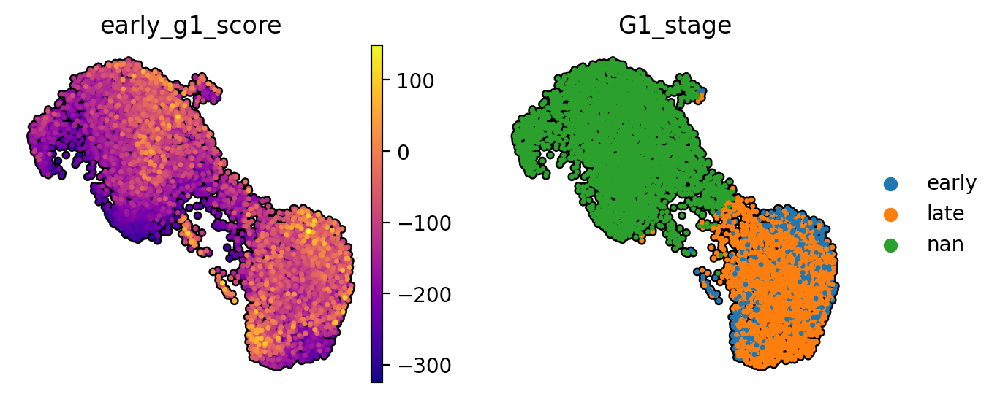

In [12]:
phase_column = 'cluster_phase' # could be cluster_phase instead

# score cells by your gene set
sc.tl.score_genes(
    adata, 
    gene_list=genes,
    score_name="early_g1_score",
    use_raw=False,
    layer='scvi',
)

# compute threshold at the 85th percentile of the scores
threshold = np.percentile(adata.obs["early_g1_score"], 85)

# print threshold and distribution summary
print("85th percentile threshold:", threshold)

adata.obs["G1_stage"] = np.where(
    adata.obs[phase_column] == "G1",                       # only assign labels in G1
    np.where(adata.obs["early_g1_score"] > threshold, "early", "late"),
    np.nan                                            # non-G1 cells
)

print(adata.obs["G1_stage"].value_counts(dropna=False))

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=['early_g1_score', 'G1_stage'],
    cmap='plasma',
    size=25,
    ncols=2,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

# GO G1 Markers

cdf.shape=(9, 7)
len(genes)=6


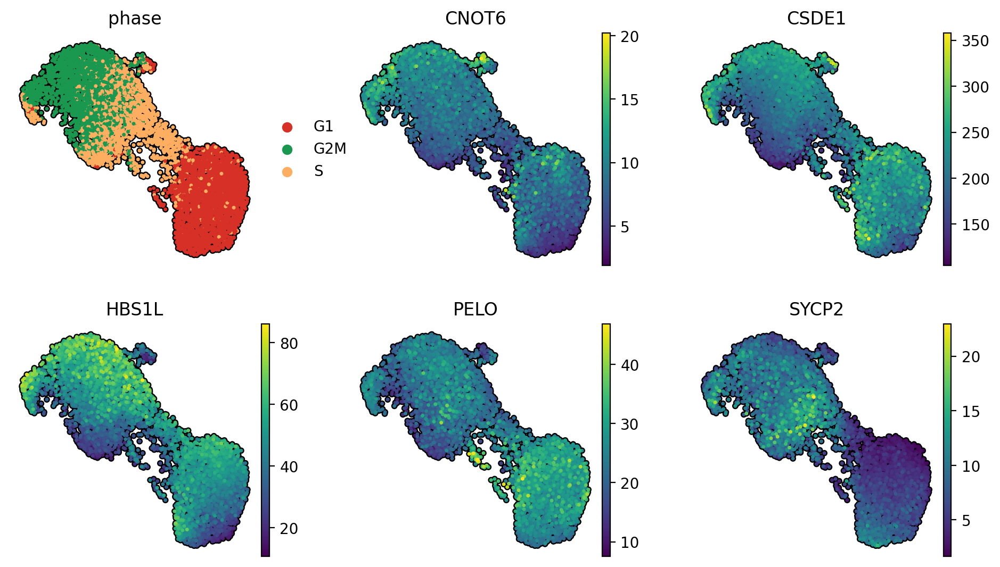

In [13]:
fpath = "../../../hematokytos/resources/human_cell_cycle_genes.csv"
cdf = pd.read_csv(fpath) 
cdf = cdf[cdf['G1 Phase']]
print(f"{cdf.shape=}")
cdf.head()

genes = cdf['gene_name'].to_list()

genes = [x for x in genes if x in adata.var_names]
genes = ['phase'] + genes
print(f"{len(genes)=}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes,
    palette=palette,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    layer='scvi',
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)


phase
SvsG0G1      1328
G2MvsG0G1    1185
len(genes)=971


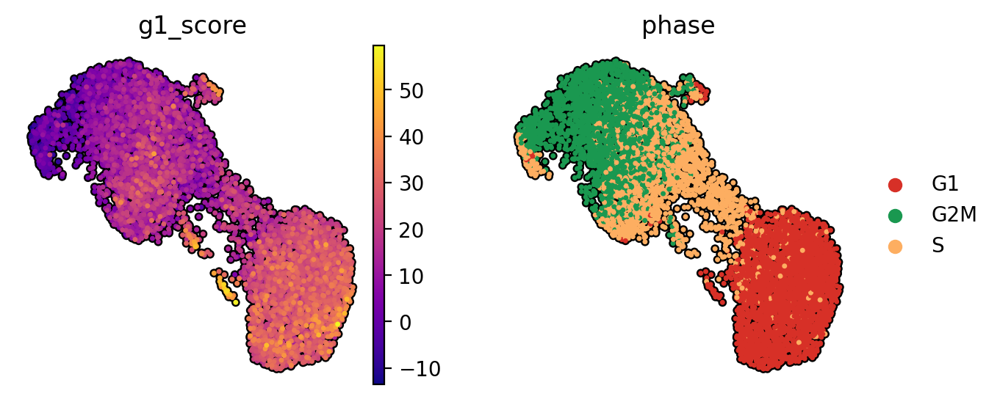

In [14]:
fpath = "liu_2017_genes.csv"
cdf = pd.read_csv(fpath)
cdf = cdf[cdf['phase'] != 'G2MvsS']

alpha = 0.05
log2FoldChange = -1
cdf = cdf[cdf['padj'] <= alpha]
cdf = cdf[cdf['log2FoldChange'] <= log2FoldChange]

print(cdf['phase'].value_counts().to_string())

genes = cdf['gene_name'].unique()
genes = [x for x in genes if x in adata.var_names]
print(f"{len(genes)=}")

# score cells by your gene set
sc.tl.score_genes(
    adata, 
    gene_list=genes,
    score_name="g1_score",
    use_raw=False,
    layer='scvi',
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=['g1_score', 'phase'],
    cmap='plasma',
    size=25,
    ncols=2,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

# Pseudotime

In [15]:
def find_closest_cell(adata, obs_key='G1_stage', value='early', obsm_key='X_scvi'):
    """
    Find the cell closest to a median vector in PCA space.

    Parameters:
        adata (AnnData): Annotated data matrix.
        obs_key (str): Key in adata.obs indicating group
        value (str): The value for aggregation 
        obsm_key (str): Key in adata.obsm for PCA or other embedding.

    Returns:
        tuple: (cell_id (str), index (int)) of the closest G1 cell in adata.obs_names
    """
    mask = adata.obs[obs_key] == value
    emb = adata.obsm[obsm_key][mask]

    median_vec = np.mean(emb, axis=0)
    dists = cdist(emb, median_vec.reshape(1, -1)).flatten()
    closest_idx = np.argmin(dists)

    cell_id = adata.obs_names[mask][closest_idx]
    cell_index = np.where(adata.obs_names == cell_id)[0][0]

    return cell_id, cell_index

find_closest_cell(adata)

('TCCAGGTAGCCATGCG-1', 6021)

cell_id='TCCAGGTAGCCATGCG-1' root_idx=6021


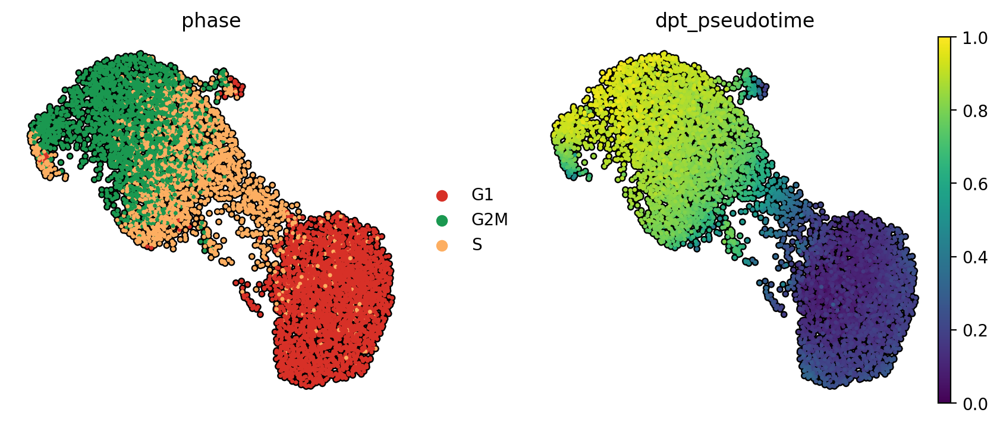

CPU times: user 2.87 s, sys: 38.8 ms, total: 2.9 s
Wall time: 1.13 s


In [16]:
%%time 
sc.pp.neighbors(adata, n_neighbors=75, use_rep='X_scvi')
sc.tl.diffmap(adata, n_comps=adata.obsm['X_scvi'].shape[1])

# choose representative cells from either G1 or G2M
cell_id, root_idx = find_closest_cell(
    adata, 
    obs_key='G1_stage', 
    value='early',
    obsm_key='X_scvi'
)

print(f"{cell_id=} {root_idx=}")

# set root and run pseudotime
adata.uns["iroot"] = root_idx
sc.tl.dpt(adata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata, 
    color=['phase', 'dpt_pseudotime'],
    size=25,
    ncols=2,
    alpha=1,
    use_raw=False,
    na_in_legend=False,
    add_outline=True,
    outline_color=('k', 'k'),
    palette=palette,
    frameon=False,
)

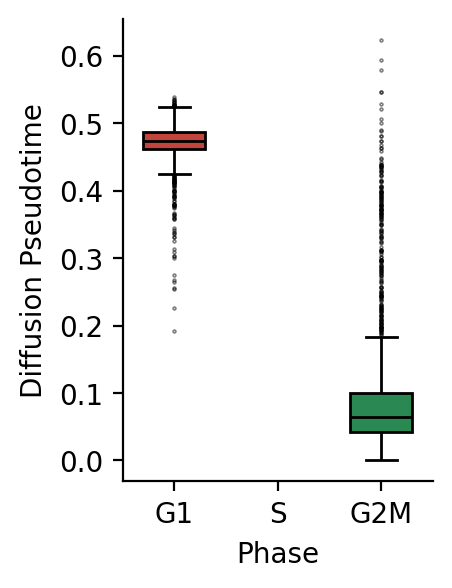

In [26]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 3

sns.boxplot(
    data=adata.obs,
    x='cluster_phase',
    y='dpt_pseudotime',
    hue='cluster_phase',
    palette=palette,
    linecolor='k',
    width=0.6,
    order=['G1', 'S', 'G2M'],
    flierprops={'markersize' : 0.6, 'alpha' : 0.5}
)

plt.ylabel('Diffusion Pseudotime')
plt.xlabel('Phase')

sns.despine()

                   phase  time_bin  time_hours  dpt_rank
AAACCAAAGGGTAGCA-1   G2M        18   18.464708  0.116177
AAACCAAAGTAAGGGT-1    G1         9    9.879587  0.823299
AAACCATTCAGGTAGG-1   G2M        19   19.657168  0.414292
AAACCATTCCAGCCCT-1    G1         4    4.035625  0.336302
AAACCATTCGTGACCG-1    G1        10   10.272889  0.856074
CPU times: user 62.8 ms, sys: 0 ns, total: 62.8 ms
Wall time: 62.7 ms


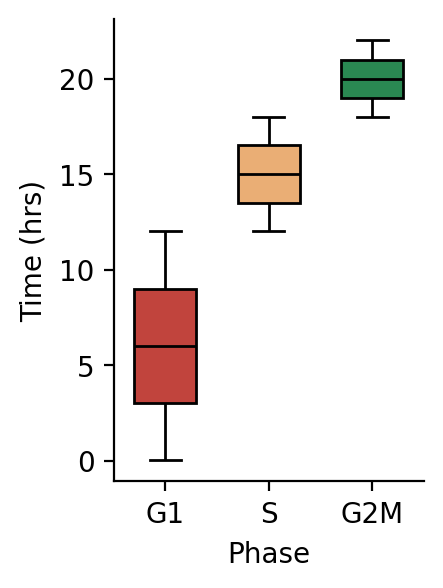

In [18]:
%%time 
phase_lengths = {'G1' : 12, 'S' : 6,'G2M' : 4,}
lengths = pd.Series(phase_lengths)
offsets = lengths.cumsum().shift(fill_value=0).to_dict()

# copy over from embed, keep them distinct
adata.obs['dpt_pseudotime'] = embed.obs['dpt_pseudotime'].reindex(adata.obs_names)
adata.obs['dpt_order']      = embed.obs['dpt_order'].reindex(adata.obs_names)
adata.obs['phase_length'] = adata.obs['phase'].map(phase_lengths).astype(float)
adata.obs['phase_offset'] = adata.obs['phase'].map(offsets).astype(float)

def directional_rank(df):
    r = df['dpt_pseudotime'].rank(pct=True, ascending=True)
    # use dpt_order for direction; fall back to no flip if NaN
    rho, _ = spearmanr(df['dpt_pseudotime'], df['dpt_order'])
    if np.isnan(rho): 
        return r
    return 1 - r if rho < 0 else r

adata.obs['dpt_rank'] = (
    adata.obs.groupby('phase', group_keys=False).apply(directional_rank)
)

adata.obs['time_hours'] = (adata.obs['dpt_rank'] * adata.obs['phase_length']) + adata.obs['phase_offset']

# every 2 hours
adata.obs['time_bin'] = pd.cut(
    adata.obs['time_hours'],
    bins=np.arange(0, adata.obs['time_hours'].max() + 1, 1),
    labels=False,  # use integers
    include_lowest=True
)

print(adata.obs[['phase', 'time_bin', 'time_hours', 'dpt_rank']].head().to_string())

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 3

sns.boxplot(
    data=adata.obs,
    x='phase',
    y='time_hours',
    hue='phase',
    palette=palette,
    linecolor='k',
    width=0.6,
    order=['G1', 'S', 'G2M'],
    flierprops={'markersize' : 0.6, 'alpha' : 0.5}
)

plt.ylabel('Time (hrs)')
plt.xlabel('Phase')
sns.despine()

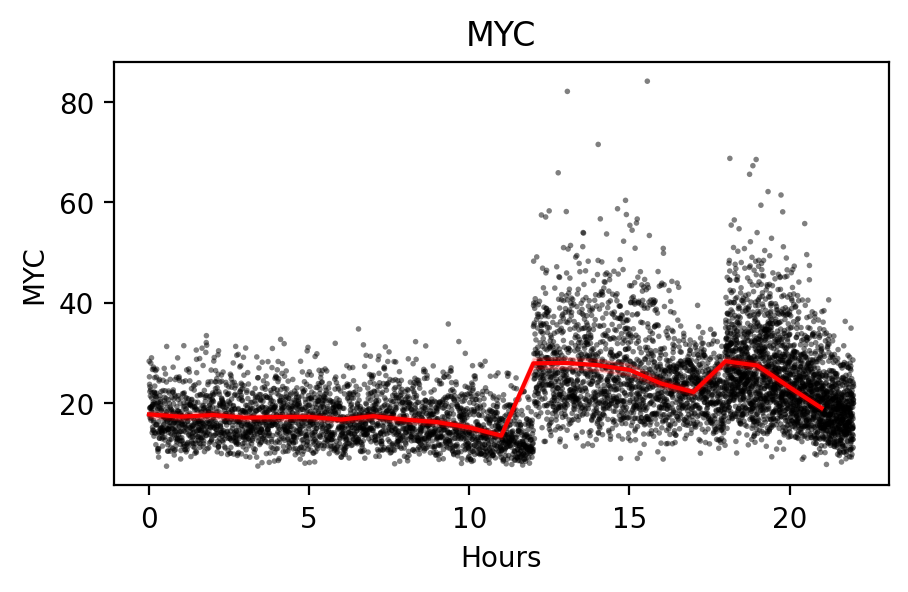

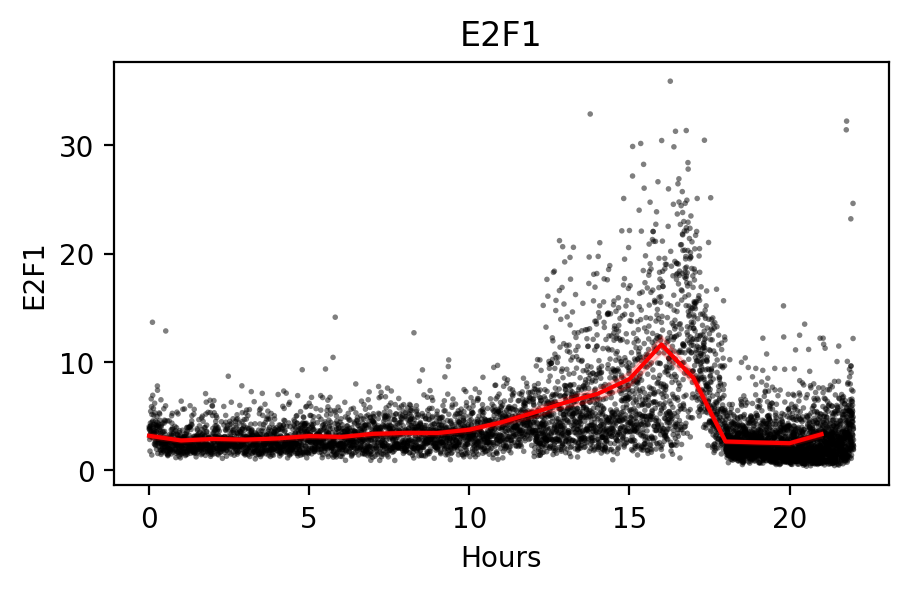

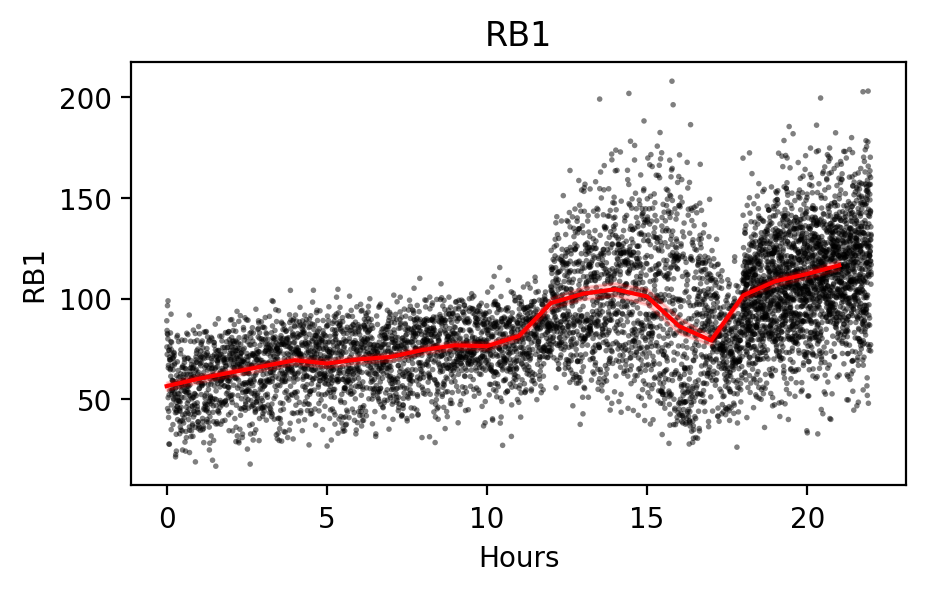

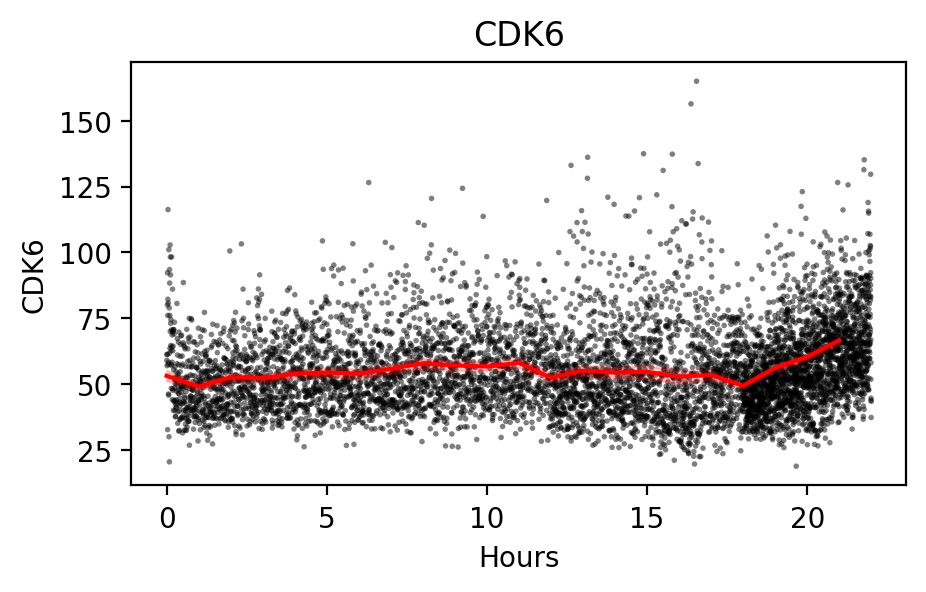

In [19]:
layer = 'scvi'
genes = [
    'MYC', "E2F1", "RB1", "CDK6"
]

for gene in genes:
    df = pd.DataFrame({
        'time_bin' : adata.obs['time_bin'].values,
        'time_hours' : adata.obs['time_hours'].values,
        'gene' : np.ravel(adata[:, gene].layers[layer].toarray()),
    })

    df = df[df['gene'] > 0]

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 5, 2.75
    sns.scatterplot(
        data=df,
        x='time_hours', 
        y='gene', 
        c='k',
        s=4,
        alpha=0.5,
        ec='none',
    )
    sns.lineplot(
        data=df,
        x='time_bin', 
        y='gene', 
        c='r',
    )
    plt.title(gene)
    plt.ylabel(gene)
    plt.xlabel('Hours')
    plt.show()

# Select Genes

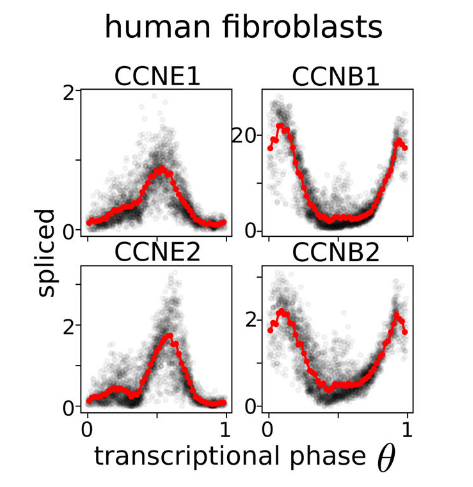

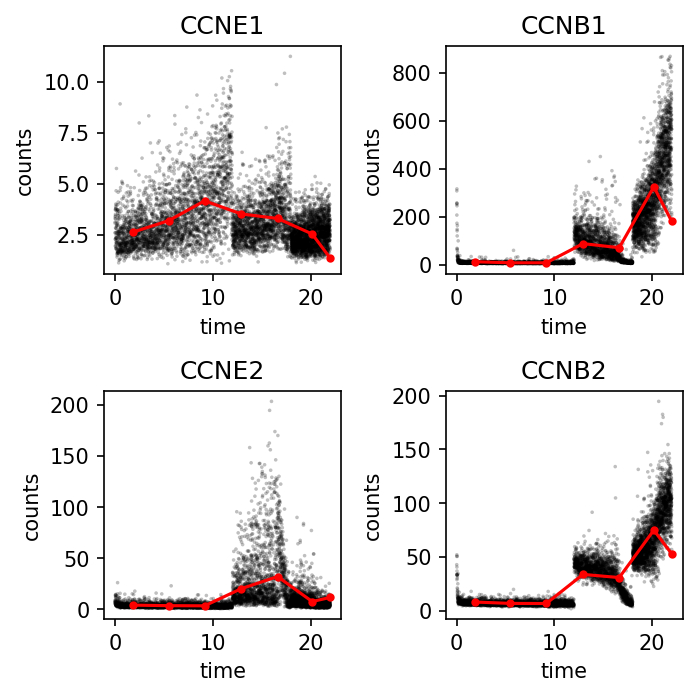

In [20]:
genes = ["CCNE1", "CCNB1", "CCNE2", "CCNB2"]

fig, axes = plt.subplots(2, 2, figsize=(4.75, 4.75), dpi=150)
axes = axes.flatten()

for i, gene in enumerate(genes):
    y = np.ravel(adata[:, gene].layers['scvi'].toarray())
    x = adata.obs['time_hours'].values
    mask = (y > 0)
    x = x[mask]
    y = y[mask]

    # Scatter
    sns.scatterplot(
        x=x, y=y, s=3,
        ec='none',
        alpha=0.25,
        color='k',
        ax=axes[i],
    )

    # Bin and smooth
    df = pd.DataFrame({'time_hours': x, 'expr': y})
    df = df.sort_values('time_hours')
    bins = np.linspace(0, df['time_hours'].max(), 7)
    df['bin'] = np.digitize(df['time_hours'], bins)
    df_smooth = df.groupby('bin')[['time_hours', 'expr']].mean()

    axes[i].plot(df_smooth['time_hours'], df_smooth['expr'], color='red', lw=1.5, marker=".")

    axes[i].set_title(gene)
    axes[i].set_xlabel(r"time")
    axes[i].set_ylabel("counts")

plt.tight_layout()
plt.show()

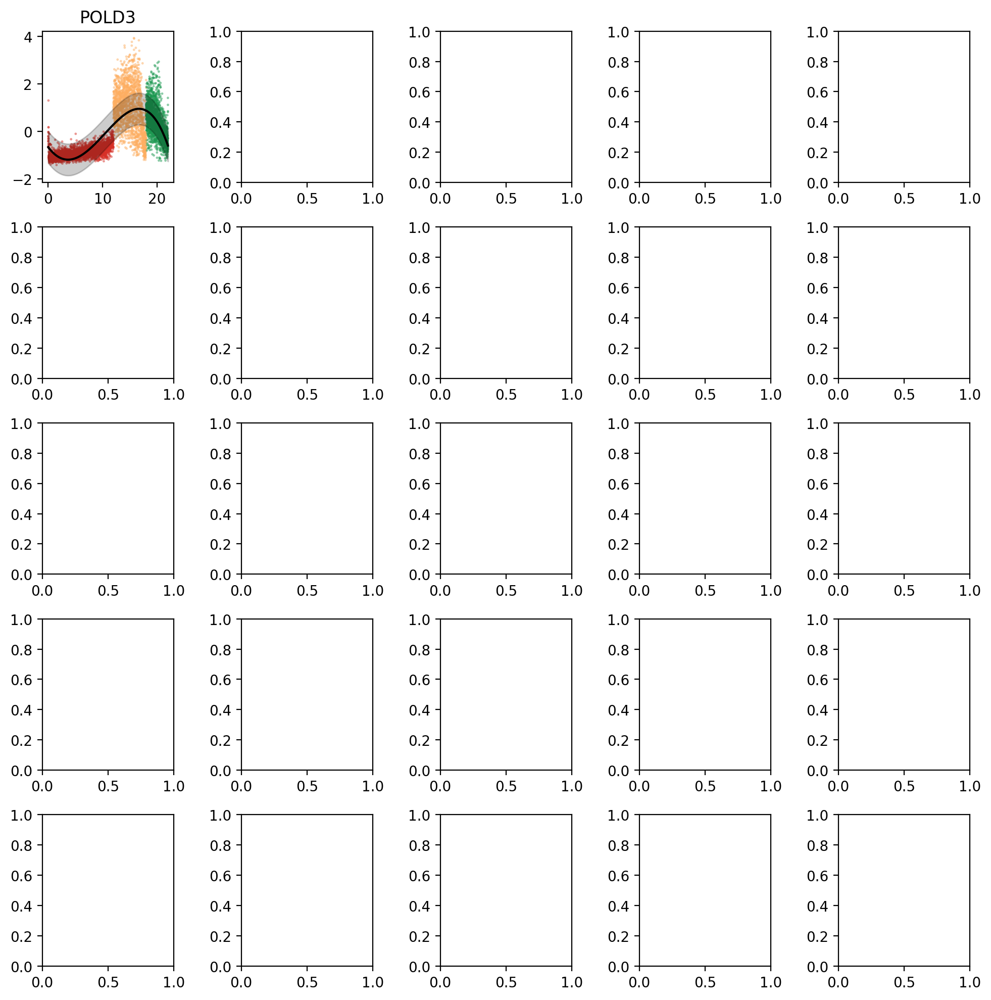

In [21]:
gene_names = [
    'POLD3', 
]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

fig, axes = plt.subplots(5, 5)
axes = axes.ravel()

for i, gene in enumerate(gene_names):
    y = adata[:, gene].layers['scvi'].ravel()
    y = zscore(y)
    x = adata.obs['time_hours'].values

    sns.scatterplot(
        x=x,y=y,s=3,
        ec='none',
        palette=palette,
        legend=False,
        alpha=0.5,
        hue=adata.obs[f'phase'],
        ax=axes[i]
    )
    axes[i].set_title(gene)
    axes[i].set_xlabel("")

    # degree=4 polyfit
    coeffs = np.polyfit(x, y, deg=4)
    p = np.poly1d(coeffs)
    x_fit = np.linspace(x.min(), x.max(), 200)
    y_fit = p(x_fit)

    # error estimate from residuals
    residuals = y - p(x)
    err = residuals.std()
    y_lower = y_fit - err
    y_upper = y_fit + err

    axes[i].plot(x_fit, y_fit, color="k")
    axes[i].fill_between(x_fit, y_lower, y_upper, color="k", alpha=0.2)

plt.tight_layout()

In [22]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

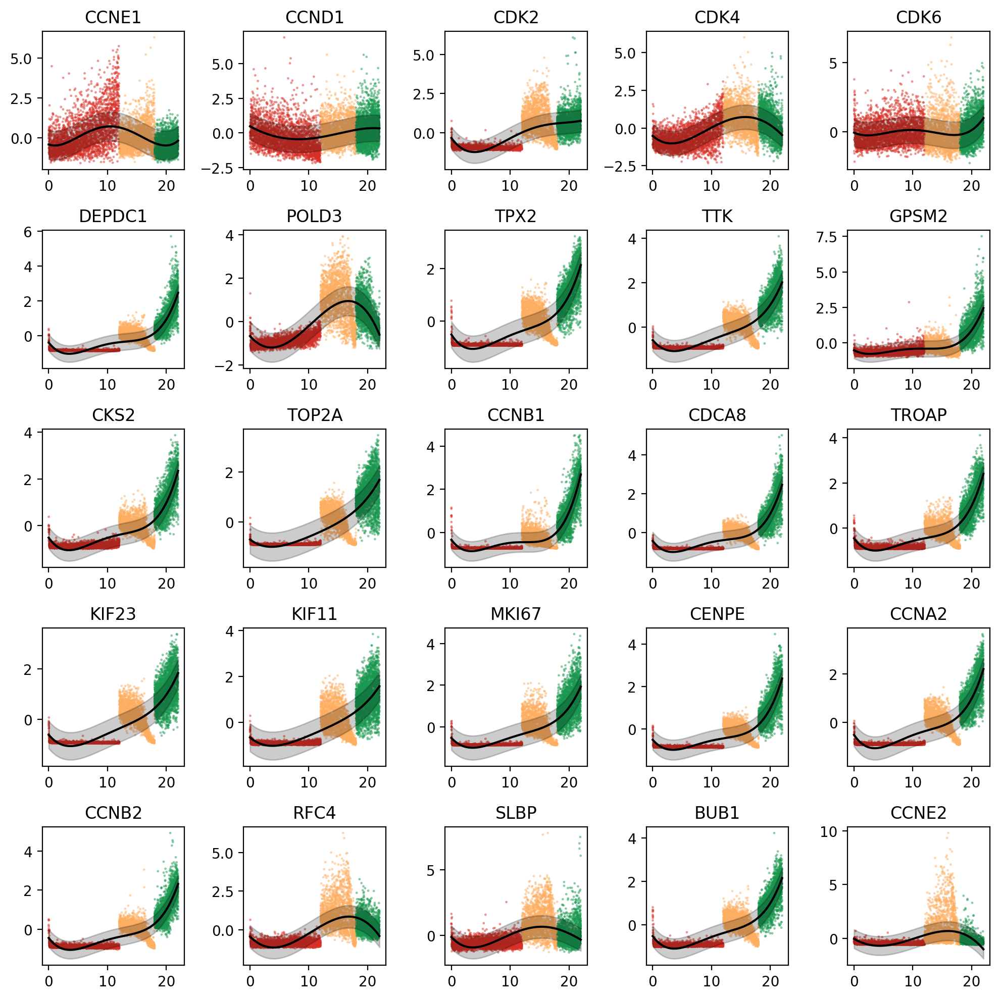

In [23]:
gene_names = [
    'CCNE1', 'CCND1', 'CDK2', 'CDK4', 'CDK6',
    'DEPDC1', 'POLD3', 'TPX2', 'TTK', 'GPSM2',
    'CKS2', 'TOP2A', 'CCNB1', 'CDCA8','TROAP',
    'KIF23', 'KIF11', 'MKI67', 'CENPE', 'CCNA2',
    'CCNB2', 'RFC4', 'SLBP', 'BUB1', 'CCNE2',
]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

fig, axes = plt.subplots(5, 5)
axes = axes.ravel()

for i, gene in enumerate(gene_names):
    y = adata[:, gene].layers['scvi'].ravel()
    y = zscore(y)
    x = adata.obs['time_hours'].values

    sns.scatterplot(
        x=x,y=y,s=3,
        ec='none',
        palette=palette,
        legend=False,
        alpha=0.5,
        hue=adata.obs[f'phase'],
        ax=axes[i]
    )
    axes[i].set_title(gene)
    axes[i].set_xlabel("")

    # degree=4 polyfit
    coeffs = np.polyfit(x, y, deg=4)
    p = np.poly1d(coeffs)
    x_fit = np.linspace(x.min(), x.max(), 200)
    y_fit = p(x_fit)

    # error estimate from residuals
    residuals = y - p(x)
    err = residuals.std()
    y_lower = y_fit - err
    y_upper = y_fit + err

    axes[i].plot(x_fit, y_fit, color="k")
    axes[i].fill_between(x_fit, y_lower, y_upper, color="k", alpha=0.2)

plt.tight_layout()

In [ ]:
break